# Seminario Avanzado de Aprendizaje Automático
# _Inteligencia Artificial Explicable_
# Práctica 3

### Miguel A. Gutiérrez Naranjo
### _Versión del 23 de mayo de 2024_

En esta práctica vamos a profundizar en el uso de técnicas de XAI para predicciones sobre imágenes. El documento básico para esta práctica han sido el código del libro **Explainable AI for Practitioners. Designing and Implmenting Explainable ML Solutions** de _M. Munn y D. Pitman_ O'Reilly, 2022 y la página de **keras** https://keras.io/

Vamos a realizar experimentos con los siguientes sistemas XAI para imágenes:
* _Integrated Gradients_
* _XRAI_
* _LIME_
* _Grad_CAM_

Instalamos y cargamos las librerías que vamos a utilizar

In [ ]:
import warnings
warnings.filterwarnings("ignore")

!pip -q install saliency tensorflow
!pip -q install felzenszwalb-segmentation
!pip -q install lime

import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import keras
import matplotlib as mpl
import saliency.core as saliency

from PIL import Image
from IPython.display import Image as Image_IP
from IPython.display import display

from matplotlib import pyplot as plt
from matplotlib import pylab as P
from skimage.segmentation import mark_boundaries
from skimage import segmentation as sk_segmentation
from skimage.segmentation import felzenszwalb, quickshift

from lime import lime_image

import os
os.environ["KERAS_BACKEND"] = "tensorflow"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.2/86.2 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


Conectamos
google Colab con nuestro Drive. No olvides cambiar el directorio a tu directorio de trabajo

In [ ]:
from google.colab import drive
drive.mount ('/content/drive')
%cd 'drive/MyDrive/SAAA_2024'

Mounted at /content/drive
/content/drive/MyDrive/SAAA_2024


# 0. Cargamos la imagen

En primer lugar, cargamos y procesamos la imagen para la cual queremos obtener una explicación de su predicción. En este caso, una cacatúa. El procesamiento lo hacemos con la función auxiliar 'read_image', que nos permite ajustar el tamaño de la imagen.

In [ ]:
def read_image(file_name):
  image = tf.io.read_file(file_name)
  image = tf.io.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize_with_pad(image, target_height=224, target_width=224)
  return image

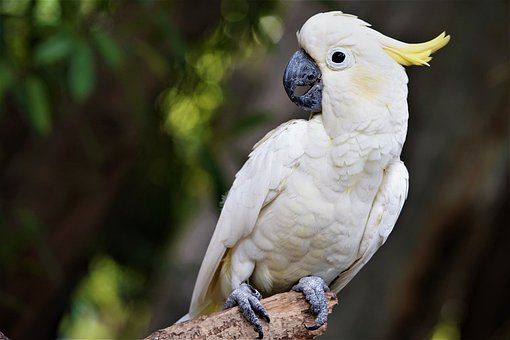

In [ ]:
img_path = './cockatoo.jpeg'
image_tensor = read_image(img_path)
tf.keras.utils.load_img(img_path, grayscale=False)

# 1. Integrated Gradients

En primer lugar, cargamos un modelo ya preentrenado, en este caso el modelo Inception v1. Lo usaremos para intentar explicar sus predicciones. Lo cargamos directamente de keras. Fíjate que lo declaramos "no entrenable" porque no estamos interesados en cambiar el valor de los pesos una vez entrenado.

In [ ]:
model = tf.keras.Sequential([
    hub.KerasLayer(
        name='inception_v1',
        handle='https://tfhub.dev/google/imagenet/inception_v1/classification/4',
        trainable=False),
])

# Fijamos el tamaño del batch de entrada para el modelo que acabamos de descargar
model.build([None, 224, 224, 3])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v1 (KerasLayer)   (None, 1001)              6633209   
                                                                 
Total params: 6633209 (25.30 MB)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 6633209 (25.30 MB)
_________________________________________________________________


Como ves, tiene más de seis millones y medio de parámetros y hemos declarado que no son entrenables. Puesto que Inception v1 ha sido entrenado con Imagenet, es interesante conocer las etiquetas de ese dataset. A partir del fichero con esas etiquetas (que podemos descargarnos), creamos un array con esas etiquetas

In [ ]:
labels_file = tf.keras.utils.get_file(origin='https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')
with open(labels_file) as reader:
  labels = reader.read().splitlines()
imagenet_labels = np.array(labels)

10484/10484 [==============================] - 0s 0us/step


In [ ]:
imagenet_labels.shape

(1001,)

Por cierto, imagenet tiene 1000 etiquetas. En la lista aprecen 1001 poque la primera no es una etiqueta real, sino que corresponde a 'background'.

In [ ]:
imagenet_labels[:10]

array(['background', 'tench', 'goldfish', 'great white shark',
       'tiger shark', 'hammerhead', 'electric ray', 'stingray', 'cock',
       'hen'], dtype='<U30')

A continuación vamos a usar el modelo para predecir la etiqueta de la imagen. Usamos la siguiente función para obtener las $k$ etiquetas más probables y sus probabilidades (expresadas en tantos por ciento).

In [ ]:
def top_k_predictions(img, k=3):
  image_batch = tf.expand_dims(img, 0)
  predictions = model(image_batch)
  probs = tf.nn.softmax(predictions, axis=-1)
  top_probs, top_idxs = tf.math.top_k(input=probs, k=k)
  top_labels = imagenet_labels[tuple(top_idxs)]
  return top_labels, top_probs[0]


Aplicamos la función a la imagen que queremos explicar

In [ ]:
pred_label, pred_prob = top_k_predictions(image_tensor)
for label, prob in zip(pred_label, pred_prob):
    print(f'{label}: {prob:0.1%}')

sulphur-crested cockatoo: 99.6%
spoonbill: 0.1%
American egret: 0.0%


Vemos que la probabilidad de que la imagen sea una 'sulphur-crested cockatoo' es mayor que 0.99. Vamos a usar _Ingredient Gradients_ para encontrar una explicación. Lo primero que vamos a hacer es crear _baselines_, esto es, imágenes sin información.

### Baselines

Vamos a crear tres baselines clásicas: Una imagen en negro, otra con ruido y otra en blanco

### Imagen en negro

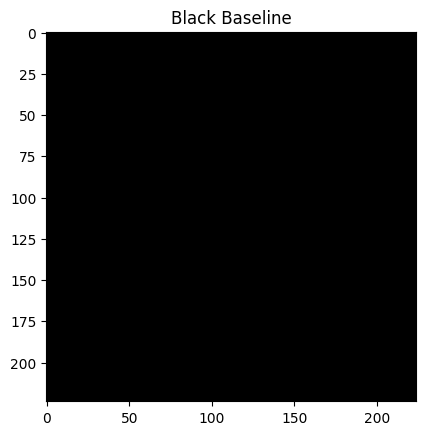

In [ ]:
black_baseline = tf.zeros(shape=(224,224,3))
plt.imshow(black_baseline)
plt.title("Black Baseline")
plt.axis('on')
plt.show()

### Imagen con ruido

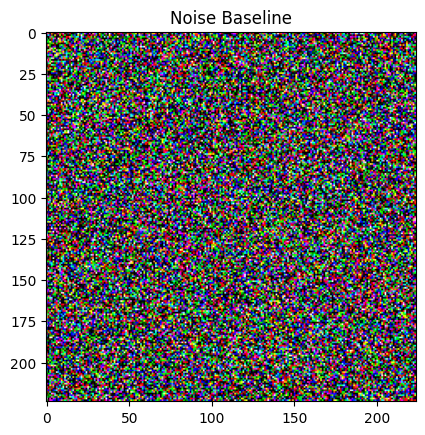

In [ ]:
noise_baseline = tf.random.normal(shape=(224,224,3))      # Generamos ruido gaussiano con media 0 y desviación típica 1
noise_baseline = tf.clip_by_value(noise_baseline, 0, 1)   # Los valores menores que cero los pasamos a cero y
                                                          # los valores mayores que 1 los transformamos en 1
plt.imshow(noise_baseline)
plt.title("Noise Baseline")
plt.axis('on')
plt.show()

### Imagen en blanco

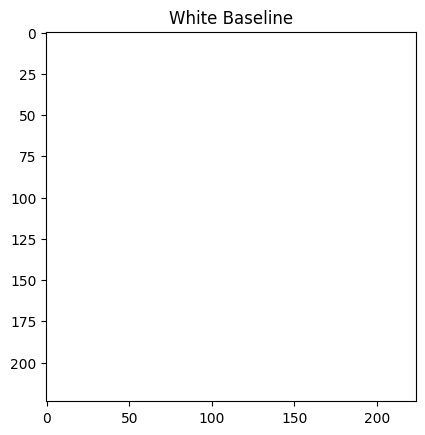

In [ ]:
white_baseline = tf.ones(shape=(224,224,3))
plt.imshow(white_baseline)
plt.title("White Baseline")
plt.axis('on')
plt.show()

A continuación definimos una función que genere nuevas imágenes (una por cada valor de alfa) interpoladas entre el _baseline_ y la imagen que queremos explicar

In [ ]:
def interpolate_images(baseline,
                       image,
                       alphas):
    alphas_x = alphas[:, tf.newaxis, tf.newaxis, tf.newaxis]
    baseline_x = tf.expand_dims(baseline, axis=0)
    input_x = tf.expand_dims(image, axis=0)
    images = alphas_x * input_x + (1 - alphas_x) * baseline_x
    return images

Creamos las imágenes e interpolamos usando como _baseline_ la imagen en negro. Dibujamos algunas de ellas.

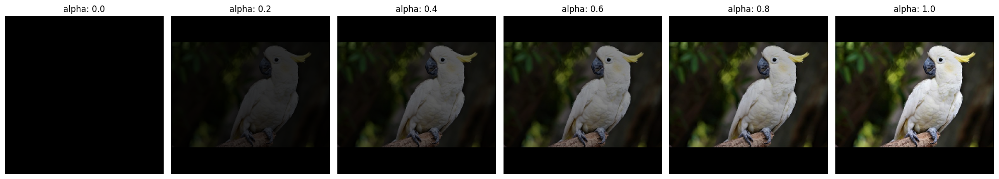

In [ ]:
m_steps=50 # Determina el número de pasos.
           # Tendremos tantas imágenes como indique m_steps más la original

alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)  # 51 imágenes
interpolated_images = interpolate_images(black_baseline,
                                         image_tensor,
                                         alphas)

fig = plt.figure(figsize=(20, 20))

i = 0
for alpha, image in zip(alphas[0::10], interpolated_images[0::10]):  # Tomamos las imágenes de 10 en 10 para dibujarlas
  i += 1
  plt.subplot(1, len(alphas[0::10]), i)
  plt.title(f'alpha: {alpha:.1f}')
  plt.imshow(image)
  plt.axis('off')

plt.tight_layout();

A continuación vamos a calcular, para cada una de esas imágenes, cuál es la probabilidad que le asigna el modelo de ser un 'sulphur-crested cockatoo'. Obviamente, las imágenes más cercanas al _baseline_ tendrán una probabilidad cercana a 0 y las más cercanas a la imagen que queremos explicar tendrán una probabilidad cercana al 0.99.

In [ ]:
LABEL = 'sulphur-crested cockatoo'
idx_cockatoo = np.where(imagenet_labels==LABEL)[0][0]

pred = model(interpolated_images)
pred_proba = tf.nn.softmax(pred, axis=-1)[:, idx_cockatoo]

Como hay 51 imágenes, vemos las 51 probabilidades

In [ ]:
pred_proba

<tf.Tensor: shape=(51,), dtype=float32, numpy=
array([0.0011114 , 0.00167294, 0.16031612, 0.6645819 , 0.86146265,
       0.93345946, 0.9614943 , 0.9787909 , 0.9874349 , 0.9922841 ,
       0.9947606 , 0.9961196 , 0.99704283, 0.9976661 , 0.9981511 ,
       0.9983954 , 0.9985744 , 0.9986858 , 0.99876344, 0.99881977,
       0.9988275 , 0.9988211 , 0.9987949 , 0.9987412 , 0.9986765 ,
       0.99860966, 0.998533  , 0.9984295 , 0.9983419 , 0.9982668 ,
       0.9981546 , 0.9980094 , 0.997865  , 0.99769753, 0.9974952 ,
       0.99731416, 0.99717087, 0.99706405, 0.9970119 , 0.9969606 ,
       0.99689   , 0.9968336 , 0.9967744 , 0.996709  , 0.99662423,
       0.99655837, 0.99647766, 0.9964072 , 0.9963601 , 0.9963309 ,
       0.9962753 ], dtype=float32)>

Podemos representar la gráfica para estudiar el crecimiento de la probabilidad según nos acercamos a la imagen original.

(0.0, 1.05)

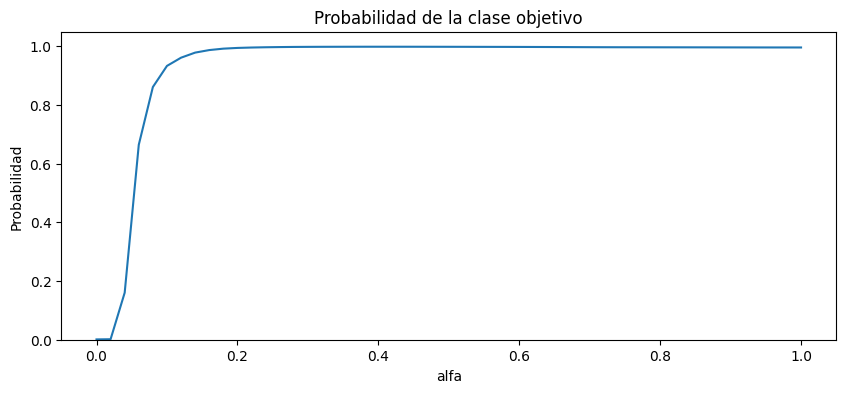

In [ ]:
plt.figure(figsize=(10, 4))
ax1 = plt.subplot(1, 1, 1)
ax1.plot(alphas, pred_proba)
ax1.set_title('Probabilidad de la clase objetivo')
ax1.set_ylabel('Probabilidad')
ax1.set_xlabel('alfa')
ax1.set_ylim([0, 1.05])

A continuación vamos a considerar la función anterior, esto es, la función que toma como entrada una imagen y devuelve un número que representa la probabilidad que el modelo asigna a la imagen para una etiqueta fijada.

**Derivamos (!?)** esa función respecto a los datos de entrada (los píxeles de la imagen) y obtenemos una función que toma como dato de entrada una imagen y devuelve, para cada píxel, un número que representa la variación que debe tomar ese pixel para que el valor de la función original (la probabilidad de pertenecer a la clase) aumente lo más rápidamente posible.

In [ ]:
def compute_gradients(images, target_class_idx):
    with tf.GradientTape() as tape:
        tape.watch(images)
        logits = model(images)
        probs = tf.nn.softmax(logits, axis=-1)[:, target_class_idx]
    return tape.gradient(probs, images)

Aplicamos esa función a todas las imágenes interpoladas, esto es, a las 51 imágenes que hemos generado entre el _baseline_ y la original.

In [ ]:
path_gradients = compute_gradients(
    images=interpolated_images,
    target_class_idx=idx_cockatoo)

Obviamente, _path_gradients_ es un tensor de 51 "imaǵenes" de tamaño $224 \times 224$ y 3 canales.

In [ ]:
path_gradients.shape

TensorShape([51, 224, 224, 3])

Para cada una de las 51 imágenes hemos obtenido un tensor del mismo tamaño de la imagen (224,224,3). Cada número de ese tensor representa el incremento que tendría que tener el valor del píxel para mejorar su clasificación.

Podemos ver que si desplazamos ligeramente el valor de los píxeles de la imagen según marca el gradiente y volvemos a calcular la predicción del modelo, la probabilidad aumenta

In [ ]:
i = 5              # Indice de la imagen en la secuencia de imágenes interpoladas
desp = 0.001       # Desplazamiento (análogo al "learning rate")

pred_0 = model(interpolated_images[i:i+1])
pred_proba_0 = tf.nn.softmax(pred_0, axis=-1)[:, idx_cockatoo]
new_images = interpolated_images + desp * path_gradients
pred_1 = model(new_images[i:i+1])
pred_proba_1 = tf.nn.softmax(pred_1, axis=-1)[:, idx_cockatoo]

print('Probabilidad original de la imagen',i,':',pred_proba_0.numpy()[0])
print('Probabilidad de la imagen modificada :',pred_proba_1.numpy()[0])

Probabilidad original de la imagen 5 : 0.93345946
Probabilidad de la imagen modificada : 0.9474434


Aunque no es necesario para aplicar el algoritmo, ahora podemos saber para qué valor (o valores) de alpha, el aprendizaje ha sido más intenso. La gráfica anterior nos indicaba que debe ser un valor entre 0 y 0.1, pero podemos afinar más si consideramos la media de los gradientes de cada una de las imágenes. Si ese valor medio es alto, entonces inferimos que un pequeño cambio en los píxeles de esa imagen conlleva una gran mejora en el valor de predicción.

In [ ]:
224 * 224 * 3

150528

En primer lugar, calculamos el valor medio de los gradientes de cada imagen. Esto es, para cada ina de las 51 imágenes calculamos la media de los $224 \times 224 \times 3 = 150528$ gradientes. La intuición es que si la media es alta, la transición de esa imagen a la siguiente ha representado un gran cambio en la evolución de la probabilidad de que la imagen sea reconocida como cacatúa.<br>
Obviamente, tendremos un valor medio por cada imagen, esto es, 51.

In [ ]:
average_grads = tf.reduce_mean(path_gradients, axis=[1, 2, 3])
average_grads.shape

TensorShape([51])

Normalizamos los valores y los representamos gráficamente

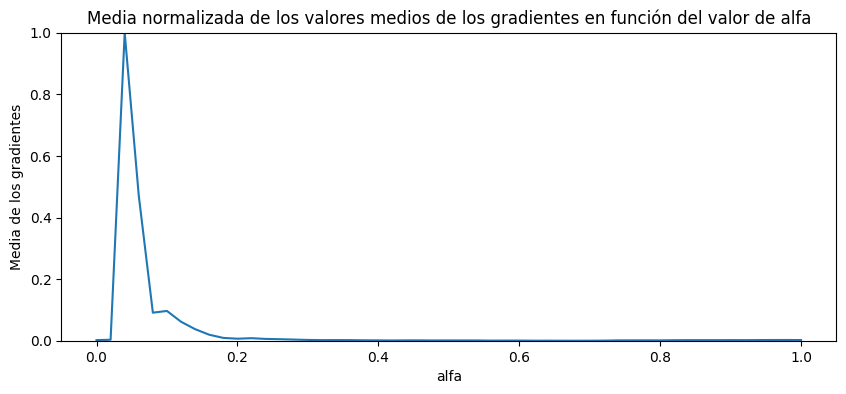

In [ ]:
average_grads_norm = (average_grads-tf.math.reduce_min(average_grads))/(tf.math.reduce_max(average_grads)-tf.reduce_min(average_grads))

plt.figure(figsize=(10, 4))
ax1 = plt.subplot(1, 1, 1)
ax1.plot(alphas, average_grads_norm)
ax1.set_title('Media normalizada de los valores medios de los gradientes en función del valor de alfa')
ax1.set_ylabel('Media de los gradientes')
ax1.set_xlabel('alfa')
ax1.set_ylim([0, 1]);

El valor de alfa donde se alcanza el máximo representa la imagen donde el valor de los gradientes (en media) era más alto y por tanto, donde la transición a la imagen siguiente determinó el mayor incremento en la probabilidad de que la imagen fuera clasificada como cacatúa. La intuición visual se confirma y nos da un valor entre 0 y 0.1.

In [ ]:
max_i = np.argmax(average_grads_norm.numpy())
print('El valor de alfa con aprendizaje más intenso ha sido', alphas.numpy()[max_i])

El valor de alfa con aprendizaje más intenso ha sido 0.04


### Usando otros _baselines_

Podemos reproducir el estudio usando otras imágenes como _baselines_ y estudiar las diferencias.

### Baseline color blanco

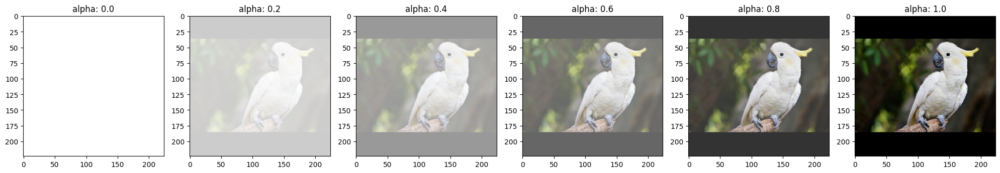

In [ ]:
interpolated_images_white = interpolate_images(white_baseline,
                                         image_tensor,
                                         alphas)

fig = plt.figure(figsize=(20, 20))

i = 0
for alpha, image in zip(alphas[0::10], interpolated_images_white[0::10]):
  i += 1
  plt.subplot(1, len(alphas[0::10]), i)
  plt.title(f'alpha: {alpha:.1f}')
  plt.imshow(image)
  plt.axis('on')

plt.tight_layout();

(0.0, 1.05)

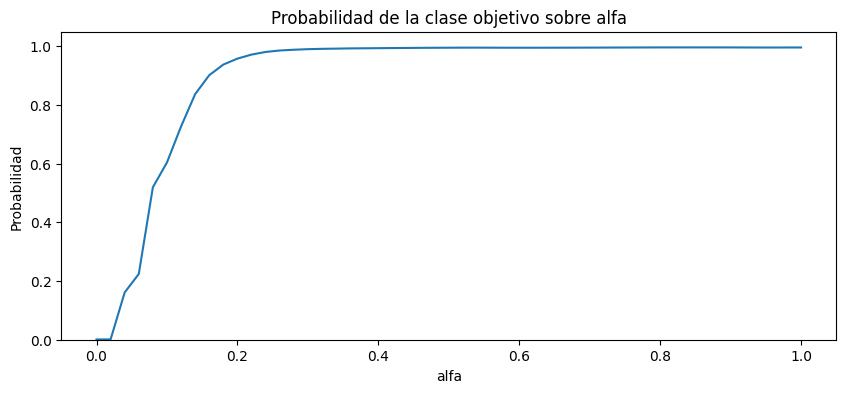

In [ ]:
pred_white = model(interpolated_images_white)

pred_proba_white = tf.nn.softmax(pred_white, axis=-1)[:, idx_cockatoo]

plt.figure(figsize=(10, 4))
ax1 = plt.subplot(1, 1, 1)
ax1.plot(alphas, pred_proba_white)
ax1.set_title('Probabilidad de la clase objetivo sobre alfa')
ax1.set_ylabel('Probabilidad')
ax1.set_xlabel('alfa')
ax1.set_ylim([0, 1.05])

### Baseline con ruido

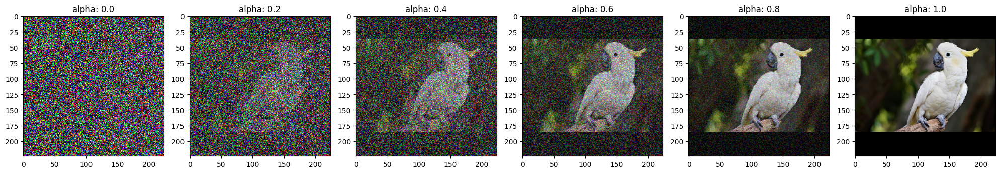

In [ ]:
interpolated_images_noise = interpolate_images(noise_baseline,
                                         image_tensor,
                                         alphas)

fig = plt.figure(figsize=(20, 20))

i = 0
for alpha, image in zip(alphas[0::10], interpolated_images_noise[0::10]):
  i += 1
  plt.subplot(1, len(alphas[0::10]), i)
  plt.title(f'alpha: {alpha:.1f}')
  plt.imshow(image)
  plt.axis('on')

plt.tight_layout();

(0.0, 1.05)

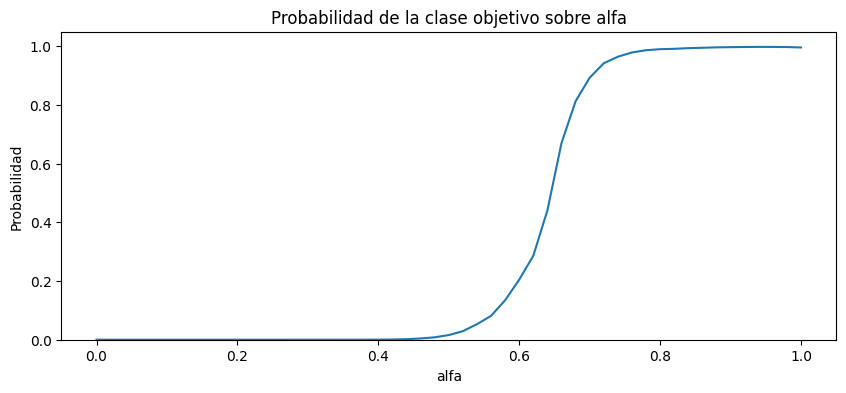

In [ ]:
pred_noise = model(interpolated_images_noise)

pred_proba_noise = tf.nn.softmax(pred_noise, axis=-1)[:, idx_cockatoo]

plt.figure(figsize=(10, 4))
ax1 = plt.subplot(1, 1, 1)
ax1.plot(alphas, pred_proba_noise)
ax1.set_title('Probabilidad de la clase objetivo sobre alfa')
ax1.set_ylabel('Probabilidad')
ax1.set_xlabel('alfa')
ax1.set_ylim([0, 1.05])

Observamos que si el baseline es blanco o negro, el aprendizaje se produce más rápido para valores pequeños de alfa. Sin embargo, con el ruido gausiano, el aprendizaje empieza a crecer a partir de $\alpha=0.5$.

No obstante, el objetivo de esta técnica de _Integrated Gradients_ es saber qué píxeles han sido más influyentes para decidir la etiqueta y para ello vamos a usar los gradientes de **todas** las imágenes. Hacemos la media pixel a pixel.

In [ ]:
def integral_approximation(gradients):
    grads = (gradients[:-1] + gradients[1:]) / tf.constant(2.0) # Hacemos un suavizado
    integrated_gradients = tf.math.reduce_mean(grads, axis=0)
    return integrated_gradients

In [ ]:
ig = integral_approximation(gradients=path_gradients)

Vemos que hemos obtenido un tensor de valores medios a partir de los gradientes de las 51 imágenes.

In [ ]:
ig.shape

TensorShape([224, 224, 3])

Por último, lo ponemos todo junto en una única función. Si el número de valores $\alpha$ es muy alto, realizar todo el proceso a la vez es muy costoso (sobre todo si las imágenes son grandes) así que fijamos un "batch_size" e iteramos el proceso por lotes, procesando cada vez tantas imágenes de la secuencia de alfas como indique el 'batch_size'.

In [ ]:
def integrated_gradients(baseline,
                         image,
                         target_class_idx,
                         m_steps=50,
                         batch_size=32):
  # Generamos los valores de alfa
  alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)

  # Generamos una lista vacío donde almacenaremos el resultado de los batches
  gradient_batches = []

  # Iteramos sobre los valores de alfa y aplicamos el algoritmo sobre un "batch" cada vez
  # usando la función "one_batch"
  for alpha in tf.range(0, len(alphas), batch_size):
    from_ = alpha
    to = tf.minimum(from_ + batch_size, len(alphas))
    alpha_batch = alphas[from_:to]
    gradient_batch = one_batch(baseline, image, alpha_batch, target_class_idx) # one_batch se define aparte
    gradient_batches.append(gradient_batch)

  # Concatenamos los batches de gradientes en un único tensor
  total_gradients = tf.concat(gradient_batches, axis=0)

  # Calculamos los valores medios
  avg_gradients = integral_approximation(gradients=total_gradients)

  # Calculamos el tensor final
  integrated_gradients = (image - baseline) * avg_gradients

  return integrated_gradients

In [ ]:
@tf.function
def one_batch(baseline, image, alpha_batch, target_class_idx):
    # Generamos las imágenes
    interpolated_path_input_batch = interpolate_images(baseline=baseline,
                                                       image=image,
                                                       alphas=alpha_batch)

    # Computamos los gradientes
    gradient_batch = compute_gradients(images=interpolated_path_input_batch,
                                       target_class_idx=target_class_idx)
    return gradient_batch

Por último, aplicamos la función anterior a nuestro ejemplo y obtenemos un tensor que denominamos *ig_attributions* que indica la importancia de cada pixel en la decisión final.

In [ ]:
ig_attributions = integrated_gradients(baseline=black_baseline,
                                       image=image_tensor,
                                       target_class_idx=90,
                                       m_steps=240)

In [ ]:
ig_attributions.shape

TensorShape([224, 224, 3])

Podemos tener una intuición gráfica si traducimos ese tensor a una imagen y la superponemos con la imagen original. Los valores cercanos a cero en el tensor, (esto es, poco importantes en la predicción final) se representarán en tonos cercanos al negro.

In [ ]:
def plot_img_attributions(baseline,
                          image,
                          target_class_idx,
                          m_steps=50,
                          cmap='Reds',
                          overlay_alpha=0.4):

  attributions = integrated_gradients(baseline=baseline,
                                      image=image,
                                      target_class_idx=target_class_idx,
                                      m_steps=m_steps)

  attribution_mask = tf.reduce_sum(tf.math.abs(attributions), axis=-1)

  fig, axs = plt.subplots(nrows=2, ncols=2, squeeze=False, figsize=(8, 8))

  axs[0, 0].set_title('Baseline image')
  axs[0, 0].imshow(baseline)
  axs[0, 0].axis('off')

  axs[0, 1].set_title('Imagen original')
  axs[0, 1].imshow(image)
  axs[0, 1].axis('off')

  axs[1, 0].set_title('Máscara de atribución')
  axs[1, 0].imshow(attribution_mask, cmap=cmap)
  axs[1, 0].axis('off')

  axs[1, 1].set_title('Superposición')
  axs[1, 1].imshow(attribution_mask, cmap=cmap)
  axs[1, 1].imshow(image, alpha=overlay_alpha)
  axs[1, 1].axis('off')

  plt.tight_layout()
  return fig

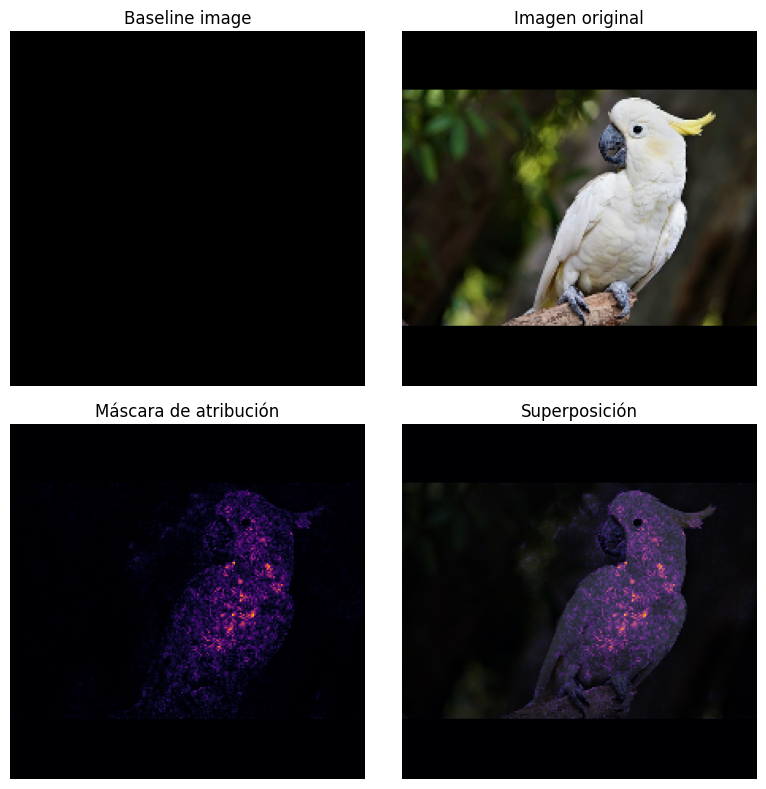

In [ ]:
_ = plot_img_attributions(image=image_tensor,
                          baseline=black_baseline,
                          target_class_idx=90,
                          m_steps=5,
                          cmap=plt.cm.inferno,
                          overlay_alpha=0.2)

Podemos reproducir el estudio con otra imagen

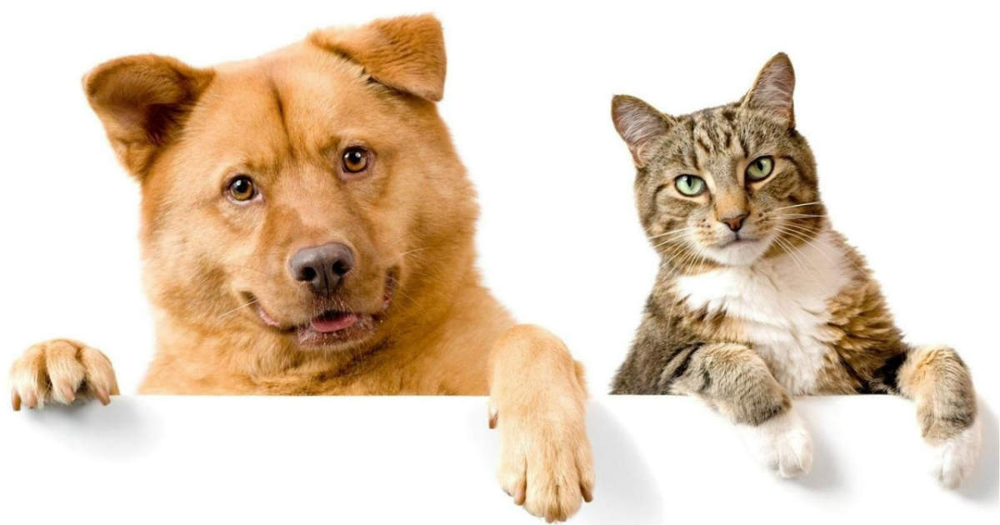

In [ ]:
img_path_2 = './dog-and-cat-cover.jpg'

image_tensor_2 = read_image(img_path_2)
tf.keras.utils.load_img(img_path_2, grayscale=False)

In [ ]:
pred_label_2, pred_prob_2 = top_k_predictions(image_tensor_2,k=10)
for label, prob in zip(pred_label_2, pred_prob_2):
    print(f'{label}: {prob:0.1%}')

lion: 9.8%
chow: 3.9%
tiger cat: 2.7%
Norwich terrier: 1.8%
dhole: 1.8%
dingo: 1.8%
tabby: 1.6%
lynx: 1.5%
Australian terrier: 1.4%
Egyptian cat: 1.2%


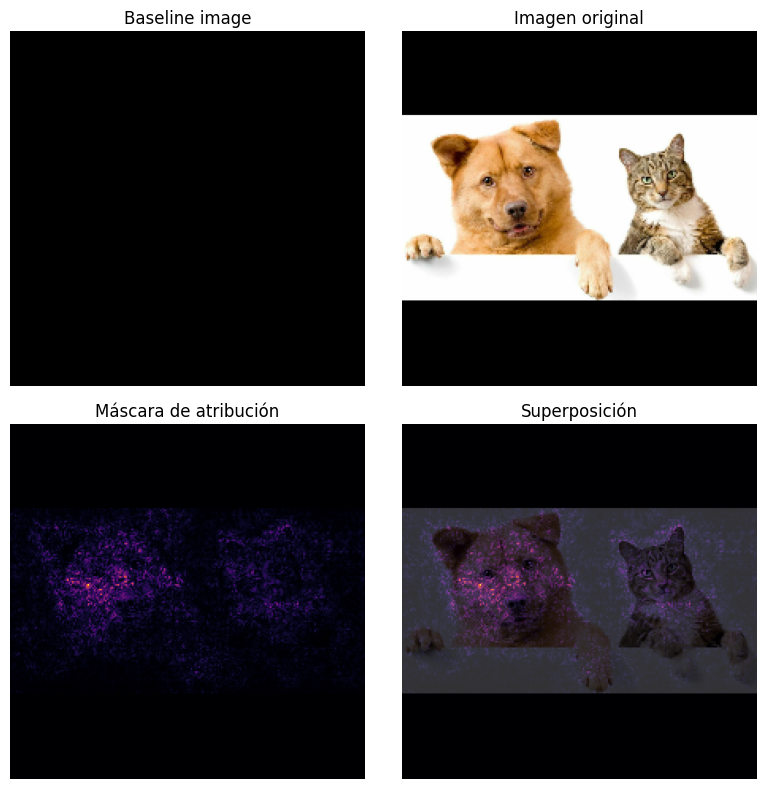

In [ ]:
LABEL_1 = 'lion'
idx_lion = np.where(imagenet_labels==LABEL_1)[0][0]

_ = plot_img_attributions(image=image_tensor_2,
                          baseline=black_baseline,
                          target_class_idx=idx_lion,
                          m_steps=50,
                          cmap=plt.cm.inferno,
                          overlay_alpha=0.2)


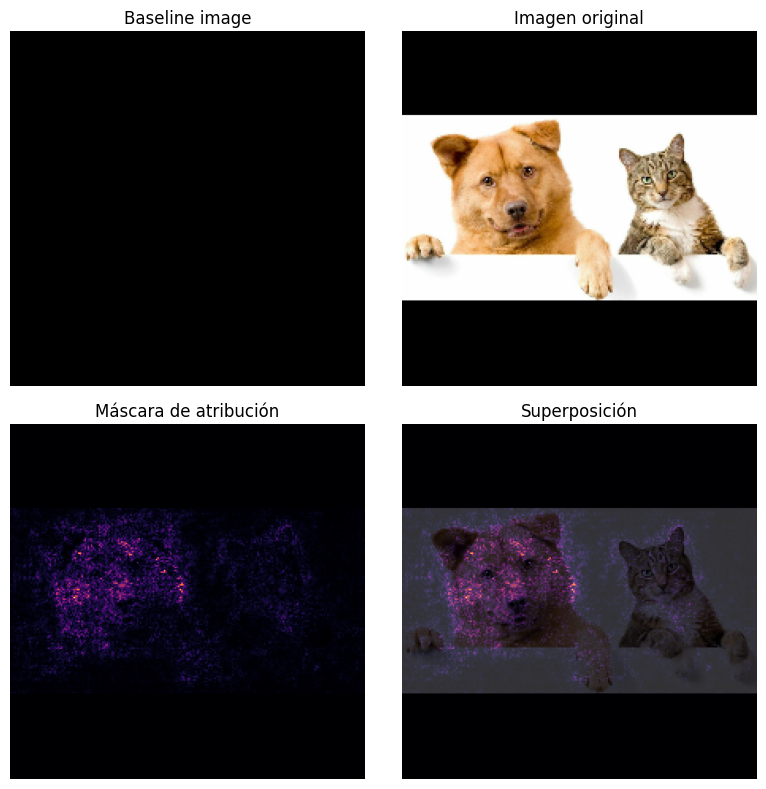

In [ ]:
LABEL_2 = 'chow'
idx_chow = np.where(imagenet_labels==LABEL_2)[0][0]

_ = plot_img_attributions(image=image_tensor_2,
                          baseline=black_baseline,
                          target_class_idx=idx_chow,
                          m_steps=50,
                          cmap=plt.cm.inferno,
                          overlay_alpha=0.2)

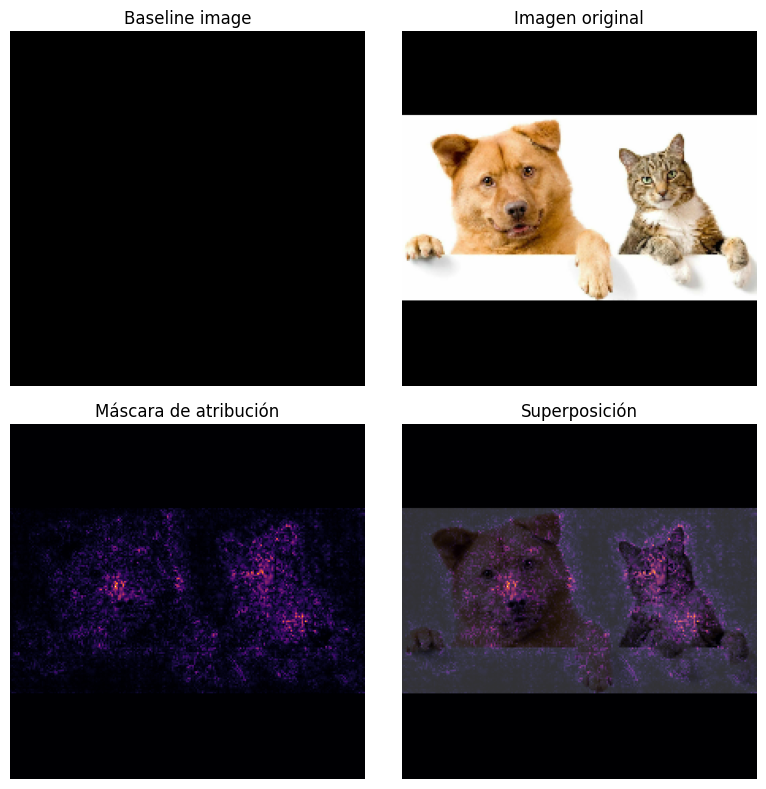

In [ ]:
LABEL_3 = 'tiger cat'
idx_tiger_cat = np.where(imagenet_labels==LABEL_3)[0][0]

_ = plot_img_attributions(image=image_tensor_2,
                          baseline=black_baseline,
                          target_class_idx=idx_tiger_cat,
                          m_steps=50,
                          cmap=plt.cm.inferno,
                          overlay_alpha=0.2)

# 2. XRAI

En este método vamos a hacer uso de la segmentación de imágenes. En lugar de destacar qué píxeles son los más determinantes a la hora de tomar una decisión, en primer lugar vamos a segmentar la imagen y luego destacaremos qué regiones (de las marcadas por la segmentación) han sido las más determinantes. En primer lugar, usaremos la segmentación de Felzenszwalb. Más información en
https://github.com/soumik12345/felzenszwalb_segmentation

Intuitivamente, lo que hacemos es combinar el método de _Integrated Gradients_ con una segmentación eficiente. Si una región obtenida por la segmentación incluye muchos de los píxeles que _Integrated Gradients_ considera importantes para la clasificación, entonces _XRAI_ considerará en que esa región es importante. Tiene la ventaja de que, si las regiones tienen una interpretación semantica clara, entonces podemos decir que era región de la imagen (cresta, pico, ala...) ha sido determinante en la clasificación.

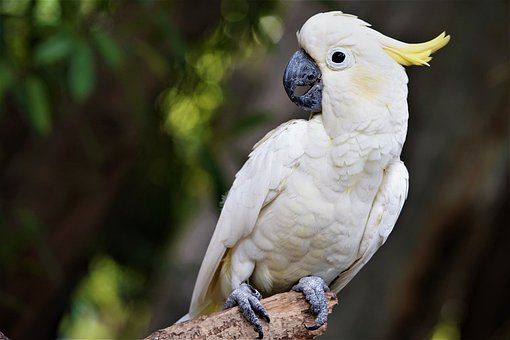

In [ ]:
tf.keras.utils.load_img(img_path, grayscale=False)

Podemos ver la segmentación de Felzenszwalb para varios valores del parámetro $k$. Intuitivamente $k$ determina la escala de observación de la segmentación ($k$ pequeño indica que habrá muchas regiones, quizás no todas significativas; $k$ grande implica pocas regiones, quizá combinando dos semánticamente diferentes). Este método de segementación no está basado en Deep Learning sino en el algortimo de Kruskal para encontrar árboles mínimos recubridores https://es.wikipedia.org/wiki/Algoritmo_de_Kruskal <br>


Usamos la implementación de esta segmentación que trae Scikit Image. Más información en https://scikit-image.org/

In [ ]:
image = np.array(Image.open(img_path))

Procesando k = 5


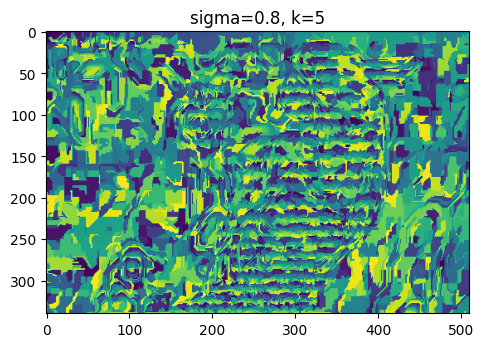

Procesando k = 50


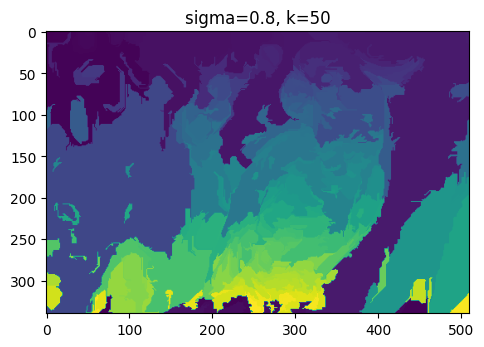

Procesando k = 100


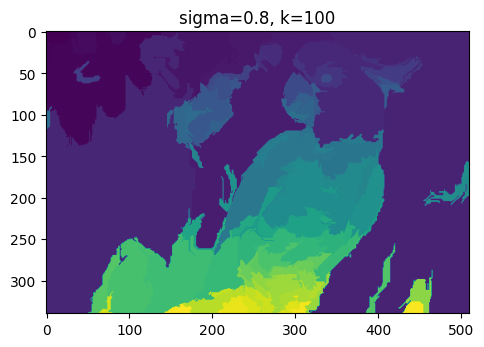

Procesando k = 500


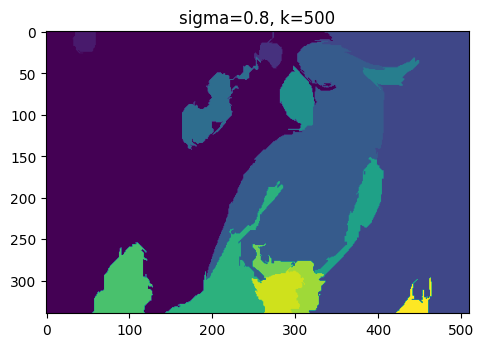

Procesando k = 1200


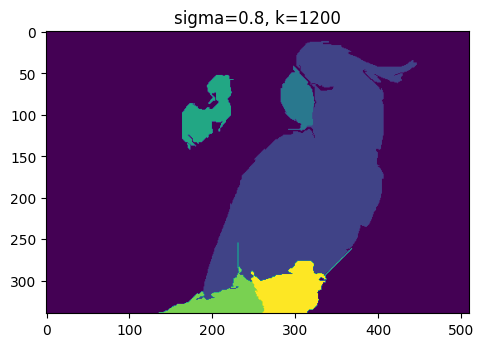

In [ ]:
for k in [5, 50, 100, 500, 1200]:
  print('Procesando k =',k)
  segmented_image = sk_segmentation.felzenszwalb(image, k, 0.8, k, 200)
  fig = plt.figure(figsize=(12, 12))
  a = fig.add_subplot(1, 2, 2)
  plt.imshow(segmented_image.astype(np.uint8))
  plt.title(f"sigma=0.8, k={k}")
  plt.show()


A continuación vamos a usar la librería _saliency_ desarrollada por el _People + AI Research Group (PAIR)_ de Google para atribuir importancia a las regiones resultado de la segmentación. Más información en https://pair-code.github.io/saliency/#home
`

En este caso usamos como modelo pre-entrenado VGG16, entrenado con el dataset 'Imagenet'.

In [ ]:
m = tf.keras.applications.vgg16.VGG16(weights='imagenet', include_top=True)

553467096/553467096 [==============================] - 4s 0us/step


Vamos a modificar ligeramente el modelo de manera que podamos obtener la predicción (m.output) pero también la salida de una de los bloques convolucionales de VGG13, el bloque 'block5_conv3'.

In [ ]:
conv_layer = m.get_layer('block5_conv3')
model = tf.keras.models.Model([m.inputs], [conv_layer.output, m.output])

Preprocesamos la imagen para usarla con VGG16

In [ ]:
im = Image.open(img_path)
im = im.resize((224,224))
im = np.asarray(im)
im = tf.keras.applications.vgg16.preprocess_input(im)

In [ ]:
# Construimos una instancia de la clase saliency.XRAI
xrai_object = saliency.XRAI()

In [ ]:
# Auxliares
class_idx_str = 'class_idx_str'

def call_model_function(images, call_model_args=None, expected_keys=None):
    target_class_idx =  call_model_args[class_idx_str]
    images = tf.convert_to_tensor(images)
    with tf.GradientTape() as tape:
        if expected_keys==[saliency.base.INPUT_OUTPUT_GRADIENTS]:
            tape.watch(images)
            _, output_layer = model(images)
            output_layer = output_layer[:,target_class_idx]
            gradients = np.array(tape.gradient(output_layer, images))
            return {saliency.base.INPUT_OUTPUT_GRADIENTS: gradients}
        else:
            conv_layer, output_layer = model(images)
            gradients = np.array(tape.gradient(output_layer, conv_layer))
            return {saliency.base.CONVOLUTION_LAYER_VALUES: conv_layer,
                    saliency.base.CONVOLUTION_OUTPUT_GRADIENTS: gradients}

In [ ]:
_, predictions = model(np.array([im]))
prediction_class = np.argmax(predictions[0])
call_model_args = {class_idx_str: prediction_class}

In [ ]:
# Compute XRAI attributions with default parameters
xrai_attributions = xrai_object.GetMask(im,
                                        call_model_function,
                                        call_model_args,
                                        batch_size=20)

Finalmente, podemos dibujar las atribuciones obtenidas con "GetMask" para obtener un mapa de calor.

In [ ]:
# Auxiliares

def ShowImage(im, title='', ax=None):
  if ax is None:
    P.figure()
  P.axis('off')
  P.imshow(im)
  P.title(title)

def ShowHeatMap(im, title, ax=None):
  if ax is None:
    P.figure()
  P.axis('off')
  P.imshow(im, cmap='inferno')
  P.title(title)

def LoadImage(file_path):
  im = Image.open(file_path)
  im = im.resize((224,224))
  # im = im.resize((299,299))   # for inceptionV3
  im = np.asarray(im)
  return im


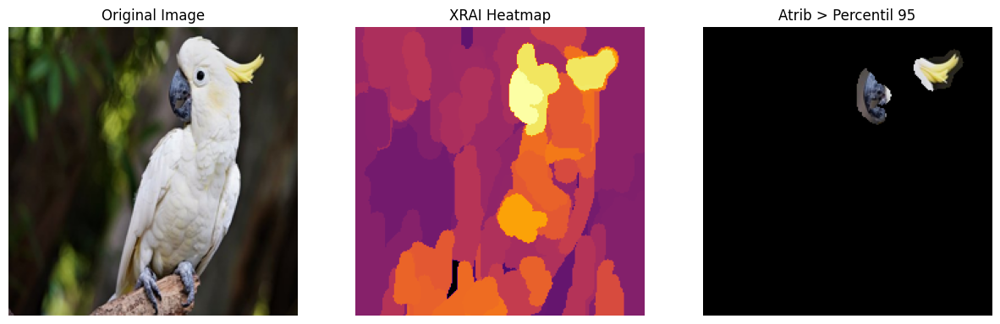

In [ ]:
im_orig = LoadImage('./cockatoo.jpeg')

# Fijamos las filas y las columnas para las imágenes que vamos a generar y un facto de escalado
ROWS = 1
COLS = 3
UPSCALE_FACTOR = 15
P.figure(figsize=(ROWS * UPSCALE_FACTOR, COLS * UPSCALE_FACTOR))

# Mostramos la imagen original
ShowImage(im_orig, title='Original Image', ax=P.subplot(ROWS, COLS, 1))

# Mostramos el mapa de calor de XRAI
ShowHeatMap(xrai_attributions, title='XRAI Heatmap', ax=P.subplot(ROWS, COLS, 2))

# Fijamos un percentil sobre el cual queremos mostrar la explicación
mi_percentil = 95

mask = xrai_attributions > np.percentile(xrai_attributions, mi_percentil)
im_mask = np.array(im_orig)
im_mask[~mask] = 0
ShowImage(im_mask, title='Atrib > Percentil ' + str(mi_percentil), ax=P.subplot(ROWS, COLS, 3))

# 3. LIME

La versión de LIME para imágenes también trabaja con segmentaciones de la imagen. La idea es muy sencilla. Podemos _apagar_ una región de la segmentación (esto es, eliminar su información poniendo todos sus píxeles en gris) y volver a realizar una predicción sobre la imagen modificada. Los cambios obtenidos en la predicción nos dan una idea de cómo de importante era la región apagada en la predicción final.<br>

Definimos primero unos ficheros auxiliares

In [ ]:
def LoadImage(file_path, model='VGG'):
    im = Image.open(file_path)
    if model == 'Inception':
        im = im.resize((299,299))
    else:
        im = im.resize((224,224))
    im = np.asarray(im)
    return im

def PreprocessVGGImage(im):
    im = tf.keras.applications.vgg16.preprocess_input(im)
    return im

def PreprocessInceptionImage(im):
    im = tf.keras.applications.inception_v3.preprocess_input(im)
    return im

Cargamos la imagen

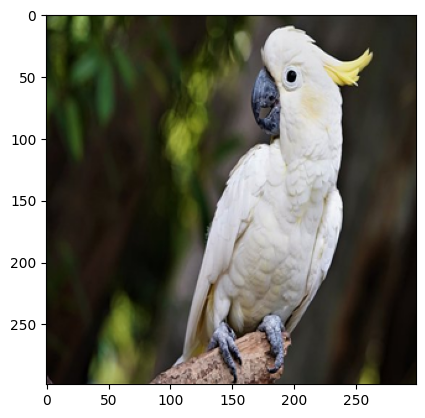

In [ ]:
im_orig = LoadImage('./cockatoo.jpeg', model='Inception')
plt.imshow(im_orig)
plt.show()

LIME llama _superpíxeles_ a las regiones obtenidas mediante segmentación. Tomaremos el método de segmentación _quickshift_ de Scikit Image.

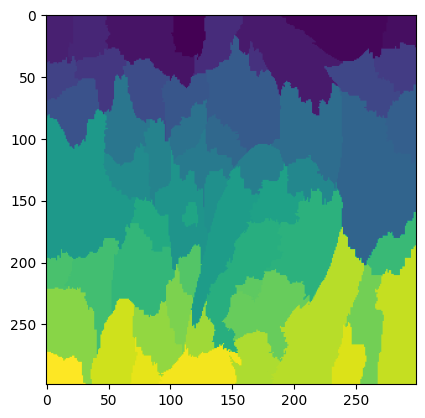

In [ ]:
segments = quickshift(im_orig,
                      kernel_size=4,
                      max_dist=200,
                      ratio=0.2,
                      random_seed=42)
plt.imshow(segments)
plt.show()

Esa segmentación no es muy informativa, pero podemos usar la librería _mark_boundaries_ para ver sobre la imagen original las regiones obtenidas.

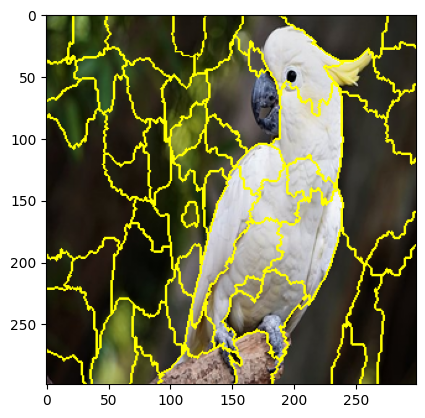

In [ ]:

plt.imshow(mark_boundaries(im_orig, segments))
plt.show()

Podemos crear nuevas imágenes coloreando de gris algunas regiones seleccionadas en la segmentación de la imagen original.

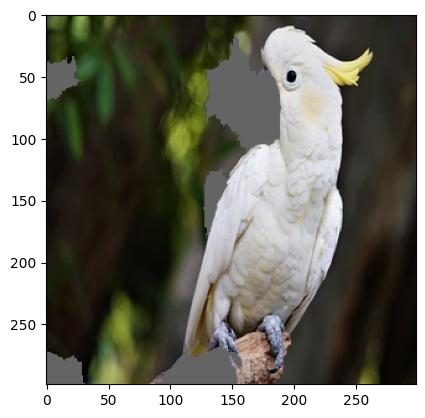

In [ ]:
segmented_image = im_orig.copy()

segmented_image[segments == 11] = 100
segmented_image[segments == 28] = 100
segmented_image[segments == 16] = 100
segmented_image[segments == 55] = 100
segmented_image[segments == 56] = 100
plt.imshow(segmented_image)
plt.show()

Podemos obtener nuevas imágenes seleccionando regiones diferentes.

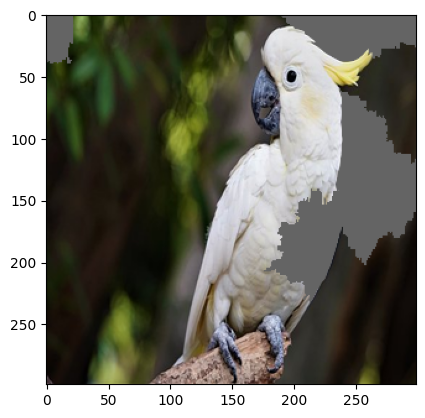

In [ ]:
fudged_image = im_orig.copy()
fudged_image[segments == 1] = 100
fudged_image[segments == 2] = 100
fudged_image[segments == 18] = 100
fudged_image[segments == 5] = 100
fudged_image[segments == 36] = 100
plt.imshow(fudged_image)
plt.show()

También podemos crear una nueva imagen sustituyendo cada región de la segmentación por el valor medio de los píxeles de la región

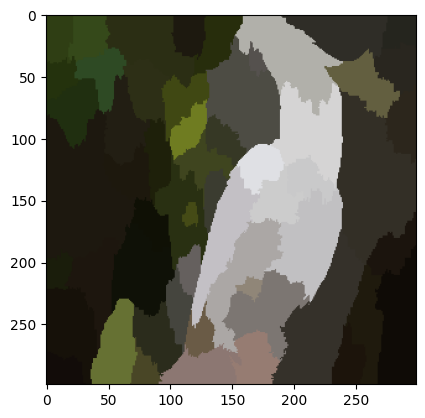

In [ ]:
segmented_image = im_orig.copy()
for x in np.unique(segments):
    segmented_image[segments == x] = (
        np.mean(im_orig[segments == x][:, 0]),
        np.mean(im_orig[segments == x][:, 1]),
        np.mean(im_orig[segments == x][:, 2]))

plt.imshow(segmented_image)
plt.show()

También podemos utilizar otra segmentación, como la de Felzenszwalb. El resultado final dependerá del método de segmentación elegido.

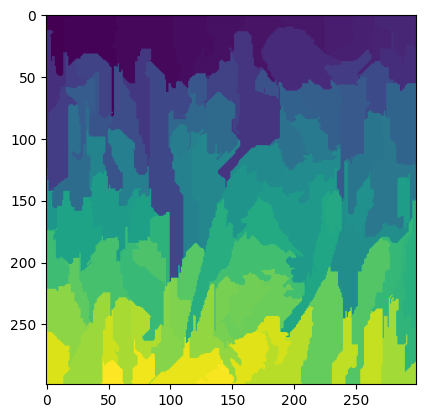

In [ ]:
segments = felzenszwalb(im_orig, min_size=200)
plt.imshow(segments)
plt.show()

Al igual que antes, usamos _mark_boundaries_ para marcar los límtes de la segmentación sobre la imagen

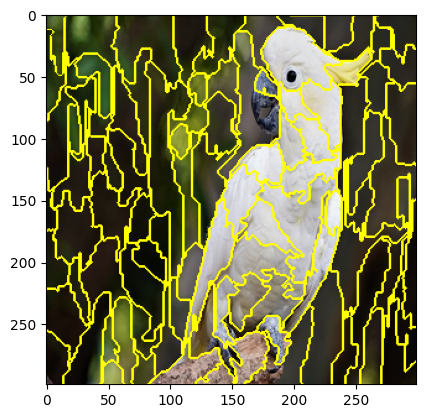

In [ ]:
plt.imshow(mark_boundaries(im_orig, segments))
plt.show()

Nuevamente, podemos crear una imagen con los valores medios de cada región

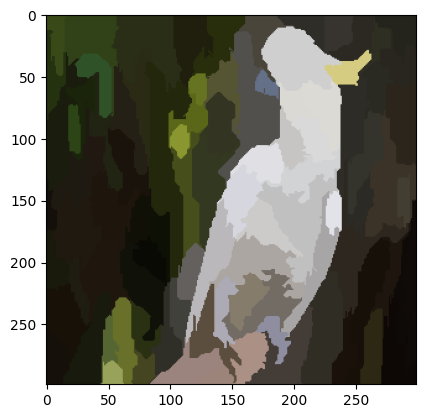

In [ ]:
segmented_image = im_orig.copy()
for x in np.unique(segments):
    segmented_image[segments == x] = (
        np.mean(im_orig[segments == x][:, 0]),
        np.mean(im_orig[segments == x][:, 1]),
        np.mean(im_orig[segments == x][:, 2]))
plt.imshow(segmented_image)
plt.show()

Finalmente tomemos un modelo de clasificación, en este caso, InceptionV3

In [ ]:
inception = tf.keras.applications.InceptionV3(
    include_top=True, weights='imagenet')
model = tf.keras.models.Model(inception.inputs, inception.output)

96112376/96112376 [==============================] - 1s 0us/step


Calculamos la predicción del modelo sobre la imagen

Prediction class: 89


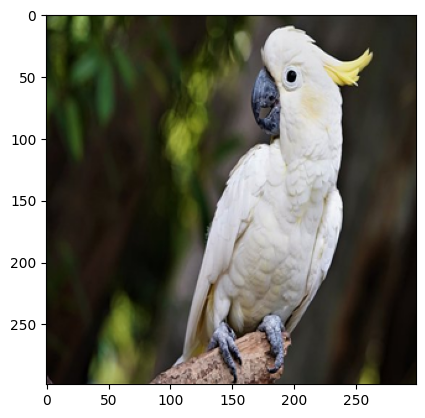

In [ ]:
# Cargamos la imagen
im_orig = LoadImage('./cockatoo.jpeg', model='Inception')
image = PreprocessInceptionImage(im_orig)
plt.imshow(im_orig)

predictions = model(np.array([image]))
prediction_class = np.argmax(predictions[0])

print("Prediction class: " + str(prediction_class))

Finalmente, usamos LIME para explicar visualmente esa predicción. La intuición es la misma que para la explicación de datos tabulados:
* En primer lugar, creamos _perturbaciones_ a partir de la imagen original. En este caso las perturbaciones son nuevas imágenes donde hemos _apagado_ ciertas regiones.
* Aplicamos el predictor sobre esas perturbaciones y obtenemos sus valores de clasificación.
* LIME crea un nuevo dataset donde las entradas son la información de qué regiones estaban encendidas (o apagadas) y qué clasificación se obtuvo.
* Ese dataset sirve para entrenar un modelo lineal que asocia un coeficiente a cada _superpíxel_.
* Ese coeficiente es una medida de cómo de importante ha sido esa región.

Creamos la instancia de 'LimeImageExplainer'

In [ ]:
explainer = lime_image.LimeImageExplainer()


explanation = explainer.explain_instance(image=image.astype('double'),
                                         classifier_fn=inception.predict,
                                         top_labels=5,
                                         hide_color=0,
                                         num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 58ms/step


Podemos ahora pedirle que dibuje las regiones más representativas que han influido positivamente en la decisión.

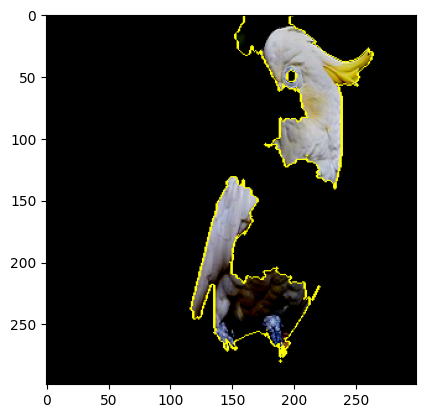

In [ ]:
temp, mask = explanation.get_image_and_mask(label=explanation.top_labels[0],
                                            positive_only=True,
                                            num_features=5,
                                            hide_rest=True)
plt.imshow(mark_boundaries(temp, mask))
plt.show()



Podemos obtener otras imágenes cambiando el valor de los parámetros.

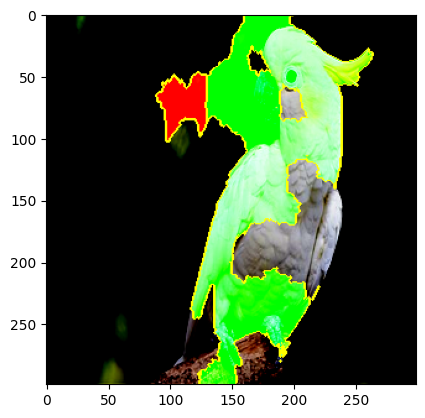

In [ ]:
temp, mask = explanation.get_image_and_mask(label=explanation.top_labels[0],
                                            positive_only=False,
                                            num_features=10,
                                            hide_rest=False)
plt.imshow(mark_boundaries(temp, mask))
plt.show()

Para ver una imagen general con superpíxeles atribuidos negativos, cambie el argumento positiv_only=False.

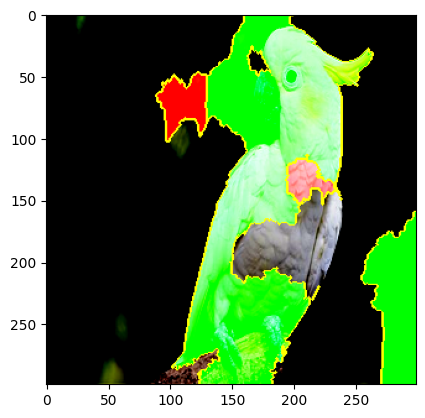

In [ ]:
temp, mask = explanation.get_image_and_mask(label=explanation.top_labels[0],
                                            positive_only=False,
                                            num_features=15,
                                            hide_rest=False)
plt.imshow(mark_boundaries(temp, mask))
plt.show()

También podemos comparar con la segunda predicción. En este caso la segunda clasificación más probable es 'spoonbill' (espátula)

In [ ]:
explanation.top_labels[1]

129

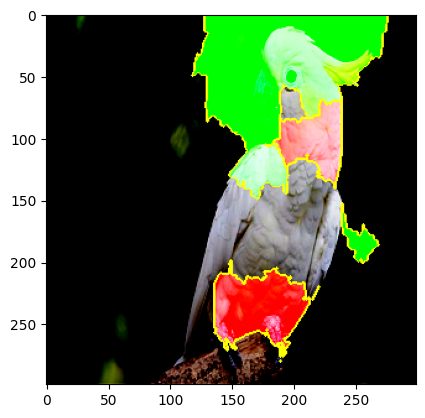

In [ ]:
temp, mask = explanation.get_image_and_mask(label=explanation.top_labels[1],
                                            positive_only=False,
                                            num_features=10,
                                            hide_rest=False)
plt.imshow(mark_boundaries(temp, mask))
plt.show()

Esto todavía da algunas explicaciones, pero si cortamos min_weight, no veremos píxeles relevantes. Aquí analizamos la siguiente predicción más alta, pero establecemos min_weight = 0,1.

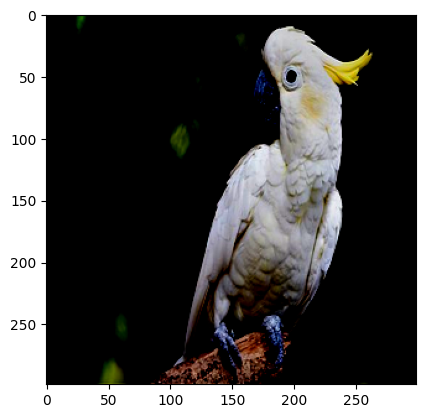

In [ ]:
temp, mask = explanation.get_image_and_mask(label=explanation.top_labels[1],
                                            positive_only=False,
                                            num_features=100,
                                            hide_rest=False,
                                            min_weight=0.1)
plt.imshow(mark_boundaries(temp, mask))
plt.show()

# 4. Grad-CAM

Para esta parte, tomamos parte del código de https://keras.io/examples/vision/grad_cam/. Una explicación detallada de cómo funciona Grad-CAM se puede encontrar en https://glassboxmedicine.com/2020/05/29/grad-cam-visual-explanations-from-deep-networks/

El algoritmo de Grad-CAM puede resumirse en los siguientes pasos:
* Sean $A_k$ los mapas de activación de la última capa convolucional del predictor y sea $y^c$ el valor de la clase de salida para la que queremos tener explicanción antes de aplicarle softmax. Calculamos el gradiente de $y^c$ respecto a cada $A_k$ $$\frac{\partial y^c}{\partial A_k}$$
* Para cada mapa de activación $k$, calculamos su valor medio y lo llamamos $\alpha_k^c$
$$\displaystyle \alpha_k^c = \frac{1}{Z} \sum_i\sum_j \frac{\partial y^c}{\partial A_k}$$
* Obtenemos una 'imagen' mediante una combinación lineal de los mapas de activación $A_k$ usando como pesos los $\alpha_k^c$ que hemos obtenido y aplicamos ReLU para llevar a cero los valores negativos $$L^c_{Grad-CAM}= ReLU(\sum_k \alpha_k^c\,A_k)$$
* Puesto que $L^c_{Grad-CAM}$ es una matriz con la misma altura y anchura que los mapas de activación de la última capa convolucional (y, en general, mucho más pequeños que la atura y anchura de la imagen original) al algoritmo termina aumentando la resolución de $L^c_{Grad-CAM}$ al tamaño de la imagen original para poder realizar la superposición de las dos imágenes.



Veamos una posible implementación. Tomamos como clasificador el modelo Xception que viene con keras y cuardamos un una varible su última capa convolucional.

In [ ]:
model_builder = keras.applications.xception.Xception
img_size = (299, 299)
preprocess_input = keras.applications.xception.preprocess_input
decode_predictions = keras.applications.xception.decode_predictions

last_conv_layer_name = "block14_sepconv2_act"

Tomamos una imagen para buscar una explicación de su clasificación. Uno de los ejemplos más usados es el del 'elefante africano'.

In [ ]:
img_path = keras.utils.get_file(
    "african_elephant.jpg", "https://keras.io/img/examples/vision/grad_cam/grad_cam_4_0.jpg"
)

display(Image_IP(img_path))

Output hidden; open in https://colab.research.google.com to view.

Definimos las funciones que nos permiten preparar la imagen y aplicar Grad-CAM

In [ ]:
def get_img_array(img_path, size):
    # 'img' es una imagen de tamaño 299 x 299
    img = keras.utils.load_img(img_path, target_size=size)
    # Transformamos la imagen en un array de numpy de tamaño 299 x 299 x 3
    array = keras.utils.img_to_array(img)
    # Añadimos una dimensión para tener un 'batch' con una imagen
    # de tamaño (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # Creamos un modelo que a cada imagen de entrada devuelva los mapas de activaciones
    # de la última capa convolucional y las predicciones
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )
    # Computamos el gradiente de la etiqueta indicada (pred_index) respecto a los
    # mapas de activación de la última capa convolucional. Si no se indica la
    # etiqueta, se toma por defecto la más probable.
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # Guardamos los gradientes en una variable
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # Hacemos la media de los gradientes de cada mapa de activación (alfas)
    # y los guardamos en una variable
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Calculamos la imagen grad-CAM multiplicando cada mapa de activación por
    # el alfa correspondiente y hacemos la suma
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Aplicamos ReLU (max{0,x}) y normalizamos entre 0 y 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

Antes de aplicar la función, tenemos que realizar algo de preprocesado

1/1 [==============================] - 1s 918ms/step
Predicted: [('n02504458', 'African_elephant', 9.862388)]


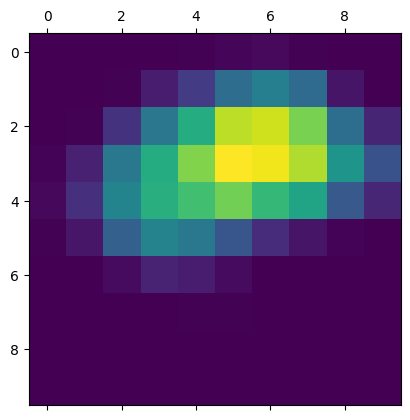

In [ ]:
# Preparamos la imagen
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Elegimos un modelo
model = model_builder(weights="imagenet")

# Eliminamos la función de activación softmax de la última capa
model.layers[-1].activation = None

# Imprimimos la clase para la que queremos obtener la explicación
preds = model.predict(img_array)
print("Predicted:", decode_predictions(preds, top=1)[0])

# Generamos el mapa de calor con Grad-CAM
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Dibujamos el mapa de calor obtenido
plt.matshow(heatmap)
plt.show()

Lo ponemos todo junto, reescalamos el mapa de calor obtenido y lo presentamos sobre la imagen original

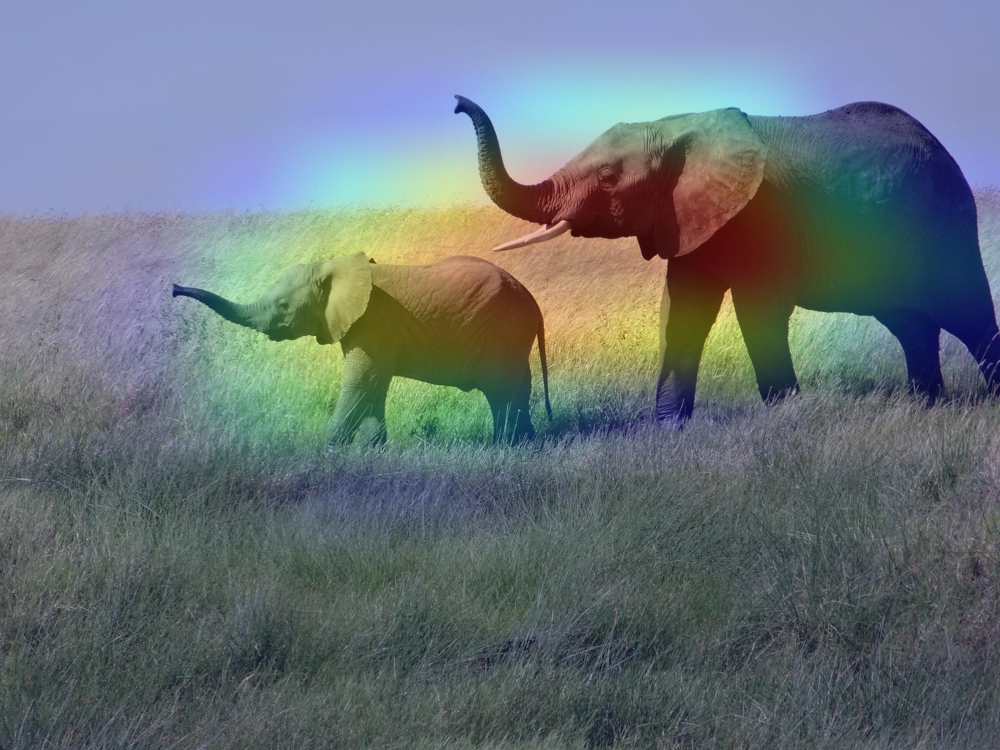

In [ ]:
def save_and_display_gradcam(img_path_input, heatmap_input, cam_path="cam.jpg", alpha=0.4):
    # Cargamos la imagen original
    img = keras.utils.load_img(img_path_input)
    img = keras.utils.img_to_array(img)

    # Reescalamos el mapa de calor a 0-255
    heatmap = np.uint8(255 * heatmap_input)

    # Elegimos un mapa de colores de matplotlib. En este caso elegimos 'jet'
    jet = mpl.colormaps["jet"]

    # Usamos valor RGB
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Creamos un nuevo mapa de calor con RGB adaptado al tamaño de la imagen original
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superponemos la imagne original y el mapa de calor
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Guardamos la imagen obtenida
    superimposed_img.save(cam_path)

    # Mostramos la superposición
    display(Image_IP(cam_path))



save_and_display_gradcam(img_path, heatmap)

### Segundo ejemplo con Grad-CAM

Vamos a ver un ejemplo con una imagen de un perro y un gato

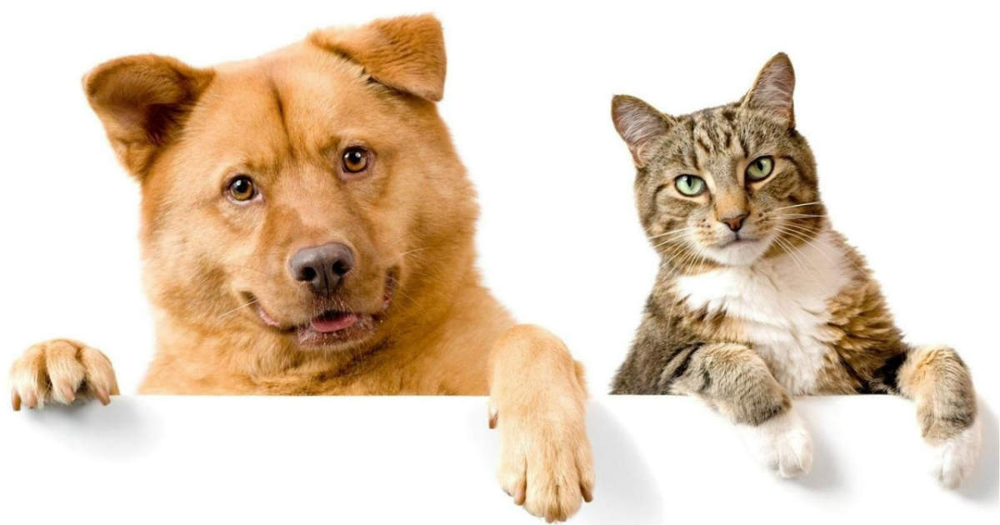

In [ ]:
img_path_perro_y_gato = keras.utils.get_file(
    "cat_and_dog.jpg",
    "https://storage.googleapis.com/petbacker/images/blog/2017/dog-and-cat-cover.jpg",
)

display(Image_IP(img_path_perro_y_gato))



Vemos las dos etiquetas más probables

In [ ]:
# Preparamos la imagen
img_array_perro_y_gato = preprocess_input(get_img_array(img_path_perro_y_gato, size=img_size))

# Buscamos las dos etiquetas más probables
preds_perro_y_gato = model.predict(img_array_perro_y_gato)
print("Predicción:", decode_predictions(preds_perro_y_gato, top=2)[0])

1/1 [==============================] - 0s 82ms/step
Predicción: [('n02112137', 'chow', 4.6112413), ('n02124075', 'Egyptian_cat', 4.381737)]


Generamos el mapa de calor para la clasificación "chow" cuyo índice es el 260.

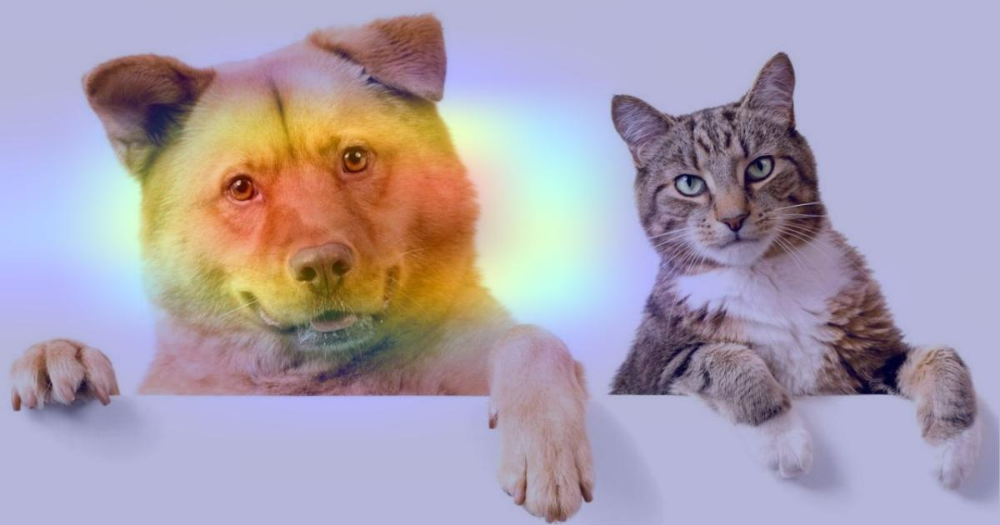

In [ ]:
heatmap_260 = make_gradcam_heatmap(img_array_perro_y_gato, model, last_conv_layer_name, pred_index=260)
save_and_display_gradcam(img_path_perro_y_gato, heatmap_260)

Podemos generar también el mapa de calor para la etiqueta "egyptian cat", cuyo índice es el 285

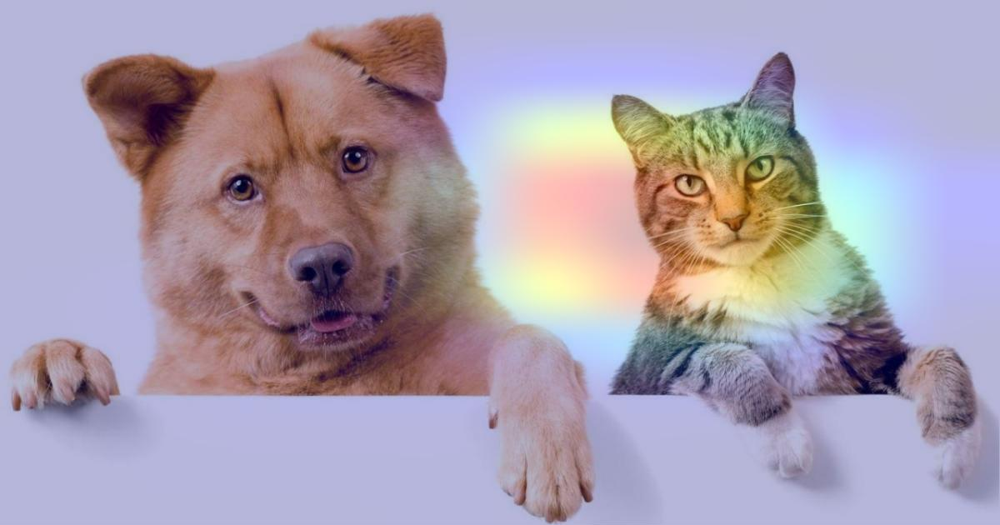

In [ ]:
heatmap_285 = make_gradcam_heatmap(img_array_perro_y_gato, model, last_conv_layer_name, pred_index=285)
save_and_display_gradcam(img_path_perro_y_gato, heatmap_285)